# Products images generation with Azure

In this notebook we will generate some artificial products images using some prompts.

Source: https://github.com/Azure/gen-cv

In [1]:
#%pip install diffusers IProgress torch transformers accelerate ipywidgets

In [2]:
import datetime
import glob
import math
import matplotlib.pyplot as plt
import os
import random
import shutil
import sys
import time

from diffusers import StableDiffusionPipeline
from PIL import Image

In [3]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

## 1. GPU

In [4]:
!nvidia-smi

Thu Jun  8 10:31:25 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.182.03   Driver Version: 470.182.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-PCIE...  On   | 00000001:00:00.0 Off |                  Off |
| N/A   26C    P0    24W / 250W |      4MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## 2. Images directory

In [5]:
IMAGES_DIR = "images"

In [6]:
model = "stabilityai/stable-diffusion-2-1"
#model = "SG161222/Realistic_Vision_V2.0"

In [7]:
pipe = StableDiffusionPipeline.from_pretrained(model)
pipe.to("cuda")

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.16.1",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

## 3. Settings

In [8]:
def generate_prompt(product):
    """
    Generating a prompt
    """
    # Image attributes
    shot = random.choice(
        [
            "extreme close-up shot",
            "close-up shot",
            "medium shot",
            #"cowboy shot",
            "medium full shot",
            "full shot",
        ]
    )

    angle = random.choice(
        [
            "worm's eye view",
            "low view",
            "hero view",
            "straight on view",
            "above shot view",
            "bird's eye view",
            "top down view",
        ]
    )

    medium = random.choice(
        [
            "action photography",
            "autochrome",
            "back lighting",
            "camera obscura",
            "camera phone",
            "color splash",
            "fast shutter speed",
            "light leaks",
            "lomography",
            "long exposure",
            "low-key lighting",
            "macro lens",
            "motion blur",
            "raw photo",
            "shallow depth-of-field",
            "telephoto lens",
            "warm lighting",
        ]
    )

    # Product values
    color = random.choice(
        [
            "Andy Warhol colors style",
            "cyan",
            "gold",
            "green",
            "lime",
            "orange",
            "pastel colors",
            "Picasso colors style",
            "pink",
            "purple",
            "rainbow",
            "Van Gogh colors style",
        ]
    )

    place = random.choice(
        [
            "a beach",
            "a dusty floor",
            "a parquet floor",
            "a glass floor",
            "a marble floor",
            "a modern carpet",
            "a rusty floor",
            "a street",
            "a puddle",
            "some rocks",
            "the grass",
        ]
    )

    # Random prompt
    prompt = f"{shot}, {medium}, {angle}, image of {color} {product} on {place}"

    return prompt

In [9]:
def calling_pipeline(prompt, num_images=1):
    """
    Generating images from prompt
    """
    # Suffix
    suffix = ", (high detailed skin:1.2), 8k uhd, dslr, high quality, soft lighting,\
    film grain, real-world, unedited, photorealistic, natural, hype beast, ergonomic,\
    product shot, intricate design"

    # Negative prompt
    negative_prompt = "(semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime:1.4),\
    text, cropped, out of frame, worst quality, low quality, jpeg artifacts, ugly,\
    duplicate, morbid, mutilated, mutation, deformed, blurry, dehydrated, bad anatomy,\
    bad proportions, person, foot, leg, feet, hand, head, arm"

    # Pipeline for images generation
    images = pipe(
        prompt=prompt + suffix,
        negative_prompt=negative_prompt,
        height=512,
        width=768,
        guidance_scale=7.5,
        num_inference_steps=70,
        num_images_per_prompt=num_images,
    ).images

    return images

In [10]:
def generating_images(nb_images=1):
    """
    Generating images
    """
    start = time.time()

    print("Generating images...\n")
    print("Products:", products)
    print("Number of products =", len(products))
    print("Number of images per product =", nb_images)
    print("Total number of images to generate =",
          nb_images * len(products), "\n")

    for product in products:
        image_id = 1
        print("\033[1;31;32m", "*" * 30, "Category product:",
              product, "*" * 30)
        print()

        for image_idx in range(nb_images):
            # Prompt generation
            prompt = generate_prompt(product)
            print(
                "\033[1;31;34m", image_id, "of", nb_images,
                "Generated prompt =", prompt
            )
            # Image generation
            image = calling_pipeline(prompt)[0]

            # Saving generated image file
            output_dir = os.path.join(IMAGES_DIR, product)
            os.makedirs(output_dir, exist_ok=True)

            output_file = os.path.join(
                output_dir,
                prompt
                + "_"
                + str(datetime.datetime.today().strftime("%d%b%Y_%H%M%S"))
                + ".png",
            )
            print("\033[0mImage saved:", output_file, "\n")
            image.save(output_file)

            image_id += 1

    elapsed = time.time() - start
    print(
        "Done. Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15],
                                               time.gmtime(elapsed))
    )

In [11]:
def del_dir(IMAGES_DIR):
    """
    Delete all contents from a directory and create an empty directory
    """
    # Deleting if exists
    if os.path.exists(IMAGES_DIR):
        print("Deleting directory", IMAGES_DIR)
        shutil.rmtree(IMAGES_DIR)
        print("Done\n")

    # Creating the directory
    print("Creating directory", IMAGES_DIR)
    os.makedirs(IMAGES_DIR, exist_ok=True)
    print("Done")

## 4. Generating the images

In [12]:
del_dir(IMAGES_DIR)

Deleting directory images
Done

Creating directory images
Done


### List of products to generate

In [13]:
products = ["sneakers shoes", "loafers shoes", "high heels shoes", "boots"]
products

['sneakers shoes', 'loafers shoes', 'high heels shoes', 'boots']

### Number of images per product to generate

In [14]:
nb_images = 15
print("Number of images per product to generate =", nb_images)

Number of images per product to generate = 15


### Generating the artificial images

In [15]:
generating_images(nb_images)

Token indices sequence length is longer than the specified maximum sequence length for this model (79 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['intricate design']


Generating images...

Products: ['sneakers shoes', 'loafers shoes', 'high heels shoes', 'boots']
Number of products = 4
Number of images per product = 15
Total number of images to generate = 60 

 ****************************** Category product: sneakers shoes ******************************

 1 of 15 Generated prompt = medium shot, shallow depth-of-field, bird's eye view, image of Picasso colors style sneakers shoes on a rusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/medium shot, shallow depth-of-field, bird's eye view, image of Picasso colors style sneakers shoes on a rusty floor_08Jun2023_103148.png 

 2 of 15 Generated prompt = close-up shot, color splash, hero view, image of pastel colors sneakers shoes on a rusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/close-up shot, color splash, hero view, image of pastel colors sneakers shoes on a rusty floor_08Jun2023_103203.png 

 3 of 15 Generated prompt = medium full shot, lomography, worm's eye view, image of purple sneakers shoes on a street


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/medium full shot, lomography, worm's eye view, image of purple sneakers shoes on a street_08Jun2023_103217.png 

 4 of 15 Generated prompt = extreme close-up shot, macro lens, straight on view, image of rainbow sneakers shoes on a puddle


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/extreme close-up shot, macro lens, straight on view, image of rainbow sneakers shoes on a puddle_08Jun2023_103232.png 



The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['design']


 5 of 15 Generated prompt = close-up shot, macro lens, worm's eye view, image of Van Gogh colors style sneakers shoes on a glass floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/close-up shot, macro lens, worm's eye view, image of Van Gogh colors style sneakers shoes on a glass floor_08Jun2023_103247.png 

 6 of 15 Generated prompt = medium full shot, color splash, above shot view, image of purple sneakers shoes on a rusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/medium full shot, color splash, above shot view, image of purple sneakers shoes on a rusty floor_08Jun2023_103302.png 

 7 of 15 Generated prompt = medium full shot, macro lens, bird's eye view, image of lime sneakers shoes on a marble floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/medium full shot, macro lens, bird's eye view, image of lime sneakers shoes on a marble floor_08Jun2023_103316.png 

 8 of 15 Generated prompt = medium shot, macro lens, straight on view, image of Picasso colors style sneakers shoes on a dusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/medium shot, macro lens, straight on view, image of Picasso colors style sneakers shoes on a dusty floor_08Jun2023_103331.png 

 9 of 15 Generated prompt = medium shot, telephoto lens, above shot view, image of green sneakers shoes on a marble floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/medium shot, telephoto lens, above shot view, image of green sneakers shoes on a marble floor_08Jun2023_103346.png 

 10 of 15 Generated prompt = extreme close-up shot, lomography, bird's eye view, image of rainbow sneakers shoes on a marble floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/extreme close-up shot, lomography, bird's eye view, image of rainbow sneakers shoes on a marble floor_08Jun2023_103400.png 

 11 of 15 Generated prompt = close-up shot, warm lighting, straight on view, image of green sneakers shoes on a dusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/close-up shot, warm lighting, straight on view, image of green sneakers shoes on a dusty floor_08Jun2023_103415.png 

 12 of 15 Generated prompt = extreme close-up shot, light leaks, top down view, image of Van Gogh colors style sneakers shoes on a street


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/extreme close-up shot, light leaks, top down view, image of Van Gogh colors style sneakers shoes on a street_08Jun2023_103430.png 

 13 of 15 Generated prompt = medium shot, raw photo, above shot view, image of pink sneakers shoes on a street


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/medium shot, raw photo, above shot view, image of pink sneakers shoes on a street_08Jun2023_103444.png 

 14 of 15 Generated prompt = medium full shot, lomography, bird's eye view, image of gold sneakers shoes on a street


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/medium full shot, lomography, bird's eye view, image of gold sneakers shoes on a street_08Jun2023_103459.png 

 15 of 15 Generated prompt = extreme close-up shot, low-key lighting, top down view, image of gold sneakers shoes on a parquet floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/sneakers shoes/extreme close-up shot, low-key lighting, top down view, image of gold sneakers shoes on a parquet floor_08Jun2023_103514.png 

 ****************************** Category product: loafers shoes ******************************

 1 of 15 Generated prompt = medium shot, camera obscura, worm's eye view, image of pink loafers shoes on a parquet floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/medium shot, camera obscura, worm's eye view, image of pink loafers shoes on a parquet floor_08Jun2023_103529.png 

 2 of 15 Generated prompt = full shot, color splash, low view, image of lime loafers shoes on a rusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/full shot, color splash, low view, image of lime loafers shoes on a rusty floor_08Jun2023_103543.png 

 3 of 15 Generated prompt = full shot, light leaks, low view, image of pink loafers shoes on a puddle


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/full shot, light leaks, low view, image of pink loafers shoes on a puddle_08Jun2023_103558.png 

 4 of 15 Generated prompt = medium shot, macro lens, hero view, image of lime loafers shoes on a street


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/medium shot, macro lens, hero view, image of lime loafers shoes on a street_08Jun2023_103613.png 

 5 of 15 Generated prompt = close-up shot, lomography, worm's eye view, image of purple loafers shoes on some rocks


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/close-up shot, lomography, worm's eye view, image of purple loafers shoes on some rocks_08Jun2023_103627.png 

 6 of 15 Generated prompt = extreme close-up shot, camera phone, bird's eye view, image of gold loafers shoes on a beach


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/extreme close-up shot, camera phone, bird's eye view, image of gold loafers shoes on a beach_08Jun2023_103642.png 

 7 of 15 Generated prompt = full shot, motion blur, low view, image of orange loafers shoes on some rocks


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/full shot, motion blur, low view, image of orange loafers shoes on some rocks_08Jun2023_103657.png 

 8 of 15 Generated prompt = medium shot, camera phone, worm's eye view, image of pastel colors loafers shoes on a modern carpet


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/medium shot, camera phone, worm's eye view, image of pastel colors loafers shoes on a modern carpet_08Jun2023_103711.png 

 9 of 15 Generated prompt = close-up shot, low-key lighting, hero view, image of pastel colors loafers shoes on a rusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/close-up shot, low-key lighting, hero view, image of pastel colors loafers shoes on a rusty floor_08Jun2023_103726.png 

 10 of 15 Generated prompt = medium full shot, telephoto lens, hero view, image of pink loafers shoes on a glass floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/medium full shot, telephoto lens, hero view, image of pink loafers shoes on a glass floor_08Jun2023_103741.png 



The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['intricate design']


 11 of 15 Generated prompt = extreme close-up shot, telephoto lens, above shot view, image of Van Gogh colors style loafers shoes on a glass floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/extreme close-up shot, telephoto lens, above shot view, image of Van Gogh colors style loafers shoes on a glass floor_08Jun2023_103756.png 

 12 of 15 Generated prompt = medium shot, action photography, worm's eye view, image of pastel colors loafers shoes on a marble floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/medium shot, action photography, worm's eye view, image of pastel colors loafers shoes on a marble floor_08Jun2023_103810.png 

 13 of 15 Generated prompt = medium shot, camera phone, top down view, image of Van Gogh colors style loafers shoes on a rusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/medium shot, camera phone, top down view, image of Van Gogh colors style loafers shoes on a rusty floor_08Jun2023_103825.png 

 14 of 15 Generated prompt = full shot, macro lens, bird's eye view, image of lime loafers shoes on some rocks


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/full shot, macro lens, bird's eye view, image of lime loafers shoes on some rocks_08Jun2023_103840.png 

 15 of 15 Generated prompt = medium full shot, warm lighting, top down view, image of Picasso colors style loafers shoes on a glass floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/loafers shoes/medium full shot, warm lighting, top down view, image of Picasso colors style loafers shoes on a glass floor_08Jun2023_103854.png 

 ****************************** Category product: high heels shoes ******************************

 1 of 15 Generated prompt = close-up shot, back lighting, low view, image of cyan high heels shoes on a dusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/close-up shot, back lighting, low view, image of cyan high heels shoes on a dusty floor_08Jun2023_103909.png 

 2 of 15 Generated prompt = medium shot, macro lens, worm's eye view, image of gold high heels shoes on the grass


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/medium shot, macro lens, worm's eye view, image of gold high heels shoes on the grass_08Jun2023_103924.png 

 3 of 15 Generated prompt = extreme close-up shot, camera obscura, hero view, image of green high heels shoes on a street


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/extreme close-up shot, camera obscura, hero view, image of green high heels shoes on a street_08Jun2023_103938.png 

 4 of 15 Generated prompt = close-up shot, fast shutter speed, worm's eye view, image of Picasso colors style high heels shoes on a puddle


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['design']


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/close-up shot, fast shutter speed, worm's eye view, image of Picasso colors style high heels shoes on a puddle_08Jun2023_103953.png 

 5 of 15 Generated prompt = close-up shot, warm lighting, low view, image of gold high heels shoes on some rocks


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/close-up shot, warm lighting, low view, image of gold high heels shoes on some rocks_08Jun2023_104008.png 

 6 of 15 Generated prompt = close-up shot, back lighting, above shot view, image of cyan high heels shoes on a beach


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/close-up shot, back lighting, above shot view, image of cyan high heels shoes on a beach_08Jun2023_104022.png 

 7 of 15 Generated prompt = full shot, light leaks, above shot view, image of gold high heels shoes on a street


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/full shot, light leaks, above shot view, image of gold high heels shoes on a street_08Jun2023_104037.png 

 8 of 15 Generated prompt = medium full shot, macro lens, above shot view, image of lime high heels shoes on a marble floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/medium full shot, macro lens, above shot view, image of lime high heels shoes on a marble floor_08Jun2023_104052.png 

 9 of 15 Generated prompt = close-up shot, telephoto lens, top down view, image of cyan high heels shoes on a marble floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/close-up shot, telephoto lens, top down view, image of cyan high heels shoes on a marble floor_08Jun2023_104107.png 

 10 of 15 Generated prompt = medium full shot, color splash, top down view, image of gold high heels shoes on a dusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/medium full shot, color splash, top down view, image of gold high heels shoes on a dusty floor_08Jun2023_104121.png 

 11 of 15 Generated prompt = full shot, camera phone, hero view, image of green high heels shoes on a parquet floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/full shot, camera phone, hero view, image of green high heels shoes on a parquet floor_08Jun2023_104136.png 

 12 of 15 Generated prompt = extreme close-up shot, camera phone, above shot view, image of Picasso colors style high heels shoes on a modern carpet


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/extreme close-up shot, camera phone, above shot view, image of Picasso colors style high heels shoes on a modern carpet_08Jun2023_104151.png 

 13 of 15 Generated prompt = medium full shot, long exposure, worm's eye view, image of pink high heels shoes on a street


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/medium full shot, long exposure, worm's eye view, image of pink high heels shoes on a street_08Jun2023_104206.png 

 14 of 15 Generated prompt = close-up shot, telephoto lens, hero view, image of purple high heels shoes on a modern carpet


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/close-up shot, telephoto lens, hero view, image of purple high heels shoes on a modern carpet_08Jun2023_104220.png 

 15 of 15 Generated prompt = close-up shot, long exposure, above shot view, image of green high heels shoes on a marble floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/high heels shoes/close-up shot, long exposure, above shot view, image of green high heels shoes on a marble floor_08Jun2023_104235.png 

 ****************************** Category product: boots ******************************

 1 of 15 Generated prompt = full shot, long exposure, straight on view, image of cyan boots on a dusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/full shot, long exposure, straight on view, image of cyan boots on a dusty floor_08Jun2023_104250.png 

 2 of 15 Generated prompt = extreme close-up shot, back lighting, bird's eye view, image of cyan boots on a rusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/extreme close-up shot, back lighting, bird's eye view, image of cyan boots on a rusty floor_08Jun2023_104304.png 

 3 of 15 Generated prompt = medium full shot, shallow depth-of-field, top down view, image of gold boots on the grass


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/medium full shot, shallow depth-of-field, top down view, image of gold boots on the grass_08Jun2023_104319.png 

 4 of 15 Generated prompt = full shot, lomography, above shot view, image of green boots on the grass


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/full shot, lomography, above shot view, image of green boots on the grass_08Jun2023_104334.png 

 5 of 15 Generated prompt = extreme close-up shot, camera phone, above shot view, image of orange boots on a puddle


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/extreme close-up shot, camera phone, above shot view, image of orange boots on a puddle_08Jun2023_104348.png 

 6 of 15 Generated prompt = extreme close-up shot, telephoto lens, low view, image of Picasso colors style boots on a rusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/extreme close-up shot, telephoto lens, low view, image of Picasso colors style boots on a rusty floor_08Jun2023_104403.png 

 7 of 15 Generated prompt = extreme close-up shot, lomography, hero view, image of rainbow boots on the grass


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/extreme close-up shot, lomography, hero view, image of rainbow boots on the grass_08Jun2023_104418.png 

 8 of 15 Generated prompt = extreme close-up shot, shallow depth-of-field, low view, image of purple boots on a dusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/extreme close-up shot, shallow depth-of-field, low view, image of purple boots on a dusty floor_08Jun2023_104433.png 

 9 of 15 Generated prompt = medium shot, shallow depth-of-field, worm's eye view, image of green boots on a puddle


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/medium shot, shallow depth-of-field, worm's eye view, image of green boots on a puddle_08Jun2023_104447.png 

 10 of 15 Generated prompt = extreme close-up shot, long exposure, hero view, image of rainbow boots on a marble floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/extreme close-up shot, long exposure, hero view, image of rainbow boots on a marble floor_08Jun2023_104502.png 

 11 of 15 Generated prompt = close-up shot, camera obscura, hero view, image of Picasso colors style boots on a rusty floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/close-up shot, camera obscura, hero view, image of Picasso colors style boots on a rusty floor_08Jun2023_104517.png 

 12 of 15 Generated prompt = full shot, autochrome, low view, image of rainbow boots on some rocks


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/full shot, autochrome, low view, image of rainbow boots on some rocks_08Jun2023_104532.png 

 13 of 15 Generated prompt = extreme close-up shot, autochrome, above shot view, image of purple boots on a glass floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/extreme close-up shot, autochrome, above shot view, image of purple boots on a glass floor_08Jun2023_104546.png 

 14 of 15 Generated prompt = close-up shot, long exposure, bird's eye view, image of Andy Warhol colors style boots on a modern carpet


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/close-up shot, long exposure, bird's eye view, image of Andy Warhol colors style boots on a modern carpet_08Jun2023_104601.png 

 15 of 15 Generated prompt = medium shot, macro lens, above shot view, image of cyan boots on a glass floor


  0%|          | 0/70 [00:00<?, ?it/s]

Image saved: images/boots/medium shot, macro lens, above shot view, image of cyan boots on a glass floor_08Jun2023_104616.png 

Done. Elapsed time: 00:14:43.913269


## 5. Results

In [16]:
def get_number_files(directory, ext):
    """
    Number of files per directory
    """
    for dirpath, dirnames, filenames in os.walk(directory):
        files_list = [file for file in filenames if file.endswith(ext)]
        print(f"{dirpath}: {len(files_list)} {ext} files")

In [18]:
def multiple_images(images_list, product, num_cols=5):
    """
    Display multiple images
    """
    num_images = len(images_list)
    num_rows = math.ceil(num_images / num_cols)
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 12))
    
    for idx, ax in enumerate(axes.flat):
        if idx < num_images:
            image = plt.imread(images_list[idx])
            ax.imshow(image)
            ax.axis("off")
    
    plt.savefig("plot_" + product + ".jpg")
    
    plt.tight_layout()
    plt.show()

In [17]:
get_number_files(IMAGES_DIR, ".png")

images: 0 .png files
images/boots: 15 .png files
images/high heels shoes: 15 .png files
images/loafers shoes: 15 .png files
images/sneakers shoes: 15 .png files


In [19]:
%%javascript

IPython.OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

Artificial images for product: sneakers shoes


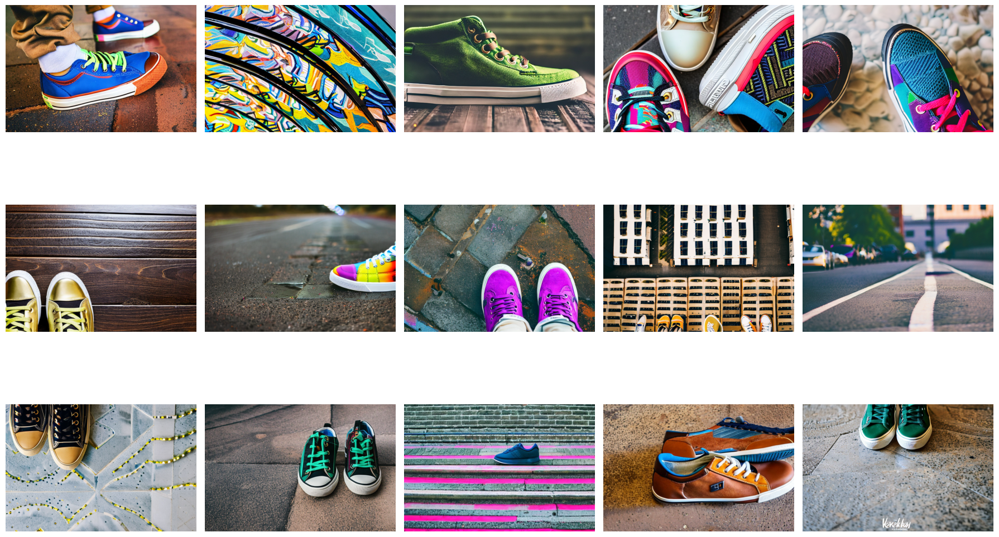

Artificial images for product: loafers shoes


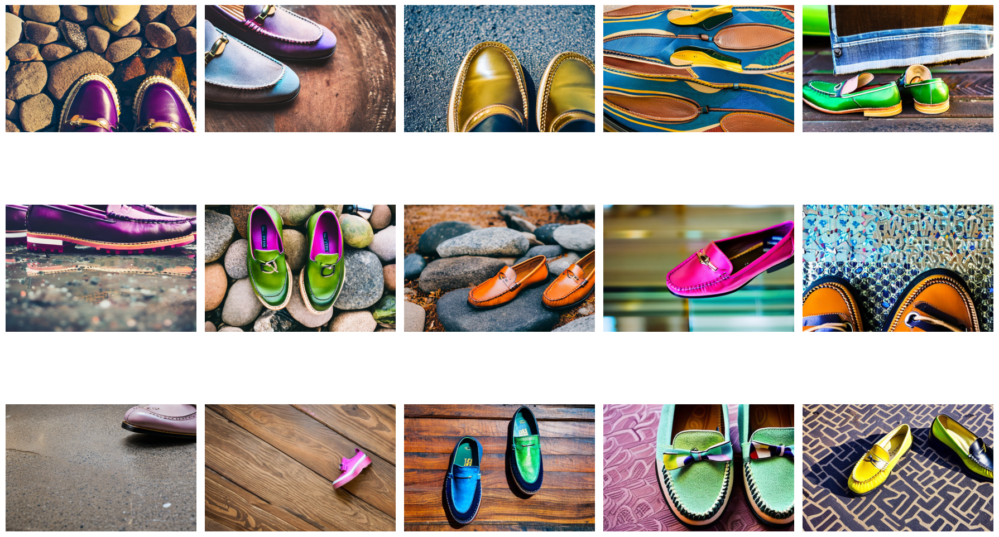

Artificial images for product: high heels shoes


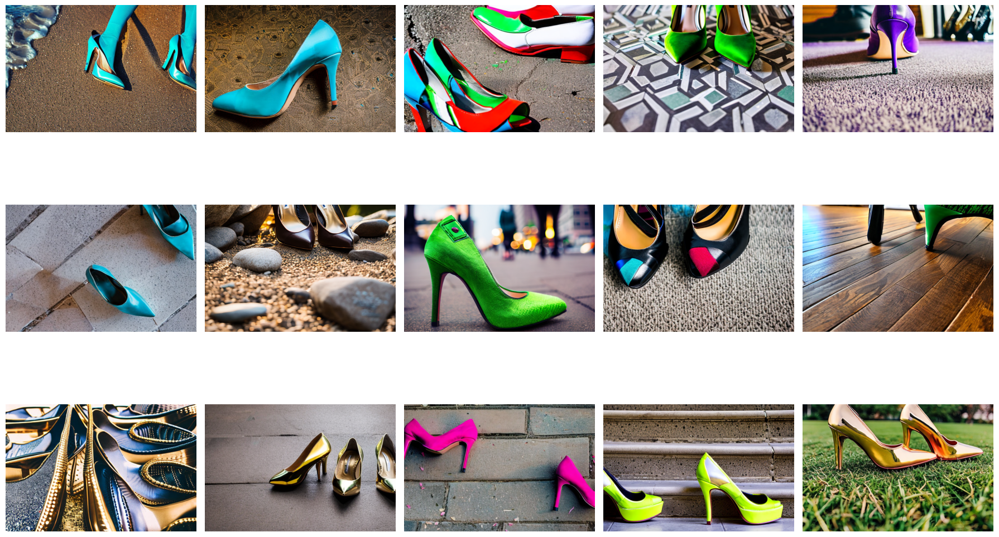

Artificial images for product: boots


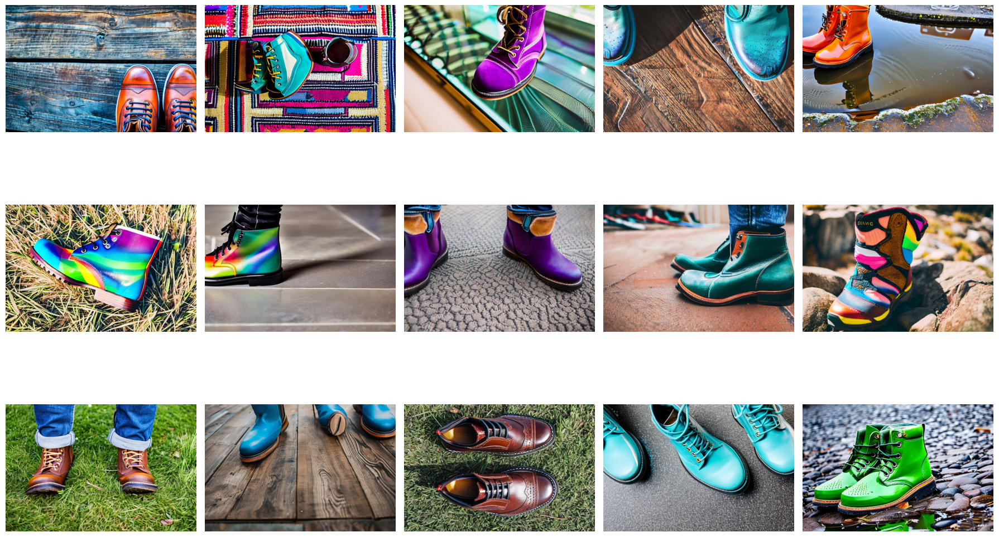

In [20]:
for product in products:
    print("Artificial images for product:", product)

    # List of images per product
    images_list = glob.glob(os.path.join(IMAGES_DIR, product, "*.png"))

    # Displaying images per product
    multiple_images(images_list, product)

In [22]:
import imageio.v2 as imageio

print("Generating an animated GIF file...")
gif_file = 'artificial_products.gif'
gif_images_list = []
plot_images_list = [file for file in os.listdir('.') if file.startswith("plot_")]

for image in plot_images_list:
    gif_images_list.append(imageio.imread(image))
    imageio.mimsave(gif_file, gif_images_list, duration = 2, fps = 30)

print("\nDone. File has been created:")
!ls $gif_file -lh

Generating an animated GIF file...

Done. File has been created:
-rwxrwxrwx 1 root root 1.9M Jun  8 11:42 artificial_products.gif


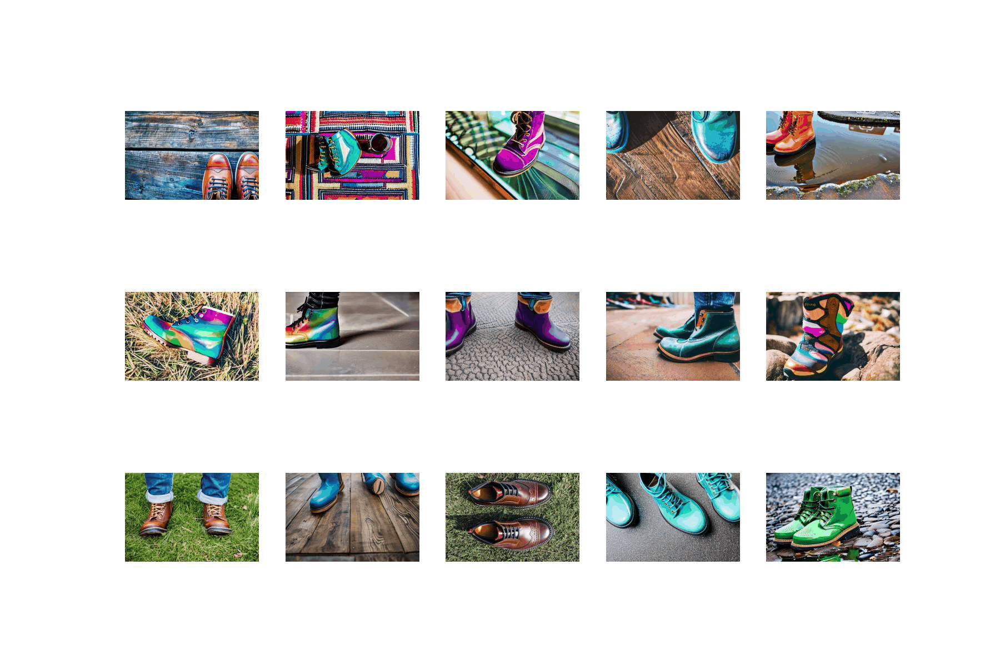

In [24]:
from IPython.display import Image

Image(filename=gif_file)